In [1]:
## Parameters specific to where your folders are and your data
parameter_file = 'params/params.yaml'
import yaml
import sys

with open(parameter_file,'r') as f:
    doc = yaml.load(f)

#p = dic2obj(**doc)

data_folder = doc['data_folder']
tissues = doc['tissues'].split(',')
sys.path.append(doc['pipeline_path'])
ref_fa = doc['ref_fa']
anno_gff=doc['annotation']
mRNA_peak_file = doc["mRNA_peak_file"]

tss_annotation = doc['tss_annotation']


import os

import sys
import pandas as pd
import matplotlib
import seaborn as sns
import pickle
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
from itertools import product
import glob
import re
from matplotlib_venn import venn2
from matplotlib import rcParams
import inspect
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
sys.setrecursionlimit(3000)
%load_ext autoreload
%autoreload 2
rcParams['figure.figsize'] = 8, 6
import tqdm

from os.path import basename
##mpl.use('Agg')
#mpl.style.use('ggplot')
#mpl.style.use('fivethirtyeight')
from Homer import *
import helper
import create_output
print('Number of tissues: ',len(tissues))

('Number of tissues: ', 13)


## Create directory

In [2]:
if not os.path.exists("Results/Figures/Figure3/Data/"):
    os.makedirs("Results/Figures/Figure3/Data/")
    
if not os.path.exists("Results/Figures/Figure3/Distance_to_Anno/"):
    os.makedirs("Results/Figures/Figure3/Distance_to_Anno/")

# Panel A + B 
A: histogram  
B: Heat map

peak options:  
1) From output   
2) From txn_df peaks  
3) CHO-specific  
4) From output but peak 1 vs others .  

Tag Options:  
1) All merged  
2) CHO-Specific

## i. Peak option 1; Tag option 1

In [3]:
## Create RefSeq peak file for this
peak_f = "Results/output/TSS1.exp.bed"
meta_f = "Results/output/TSS1.exp.meta"
save_f = "Results/Figures/Figure3/A.TSS1_mrna"
tag_f = "Results/merged/tags_TSS_merged"

#mrna_filt = "Results/Figures/Figure3/A.mrna"
create_output.exp_bed_to_refseq(peak_f,meta_f,refseq_f=mRNA_peak_file,save_f=save_f,is_unique=True)

,0,1,2,3,4,5
3,,,,,,
p1@Bmp4_XM_027386529.1,NW_020822366.1,722307,722309,p1@Bmp4_XM_027386529.1,1.779596,-
p1@Bmp4_XM_027386528.1,NW_020822366.1,724609,724611,p1@Bmp4_XM_027386528.1,4.074290,-
p1@Cdkn3_XM_027386531.1,NW_020822366.1,1085434,1085436,p1@Cdkn3_XM_027386531.1,1.212188,+
p1@Cnih1_XM_027386534.1,NW_020822366.1,1114412,1114414,p1@Cnih1_XM_027386534.1,1.527630,-
p1@Cgrrf1_XM_027386536.1,NW_020822366.1,1159882,1159884,p1@Cgrrf1_XM_027386536.1,1.748963,+
p1@Samd4a_XM_027386537.1,NW_020822366.1,1214840,1214842,p1@Samd4a_XM_027386537.1,1.346353,+
p1@Samd4a_XM_027386539.1,NW_020822366.1,1333155,1333157,p1@Samd4a_XM_027386539.1,1.198657,+
p1@Gch1_XM_027386540.1,NW_020822366.1,1513794,1513796,p1@Gch1_XM_027386540.1,1.654177,-
p1@Wdhd1_XM_027386542.1,NW_020822366.1,1605102,1605104,p1@Wdhd1_XM_027386542.1,1.665581,-


('output histogram exp', 'Results/Figures/Figure3/A.exp.hist')
annotatePeaks.pl Results/output/TSS1.exp.bed /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -d Results/merged/tags_TSS_merged -pc 3 > Results/Figures/Figure3/A.exp.hist
annotatePeaks.pl Results/output/TSS1.exp.bed /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -histNorm 100 -d Results/merged/tags_TSS_merged -pc 3 > Results/Figures/Figure3/A.exp.histNorm
annotatePeaks.pl Results/output/TSS1.exp.bed /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -ghist -d Results/merged/tags_TSS_merged -pc 3 -strand + > Results/Figures/Figure3/A

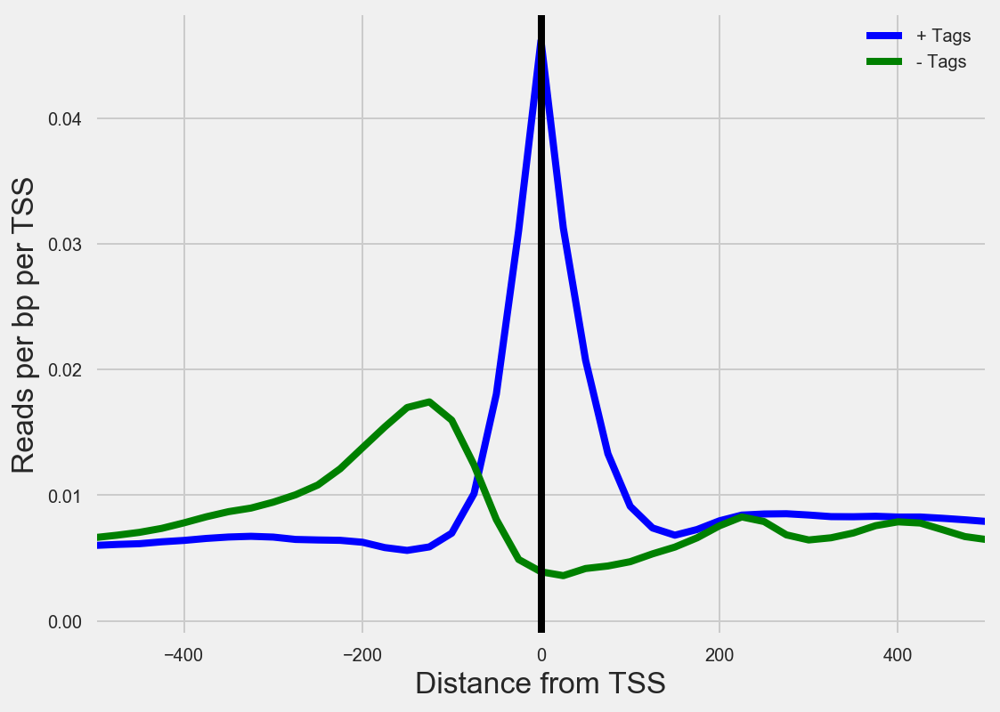

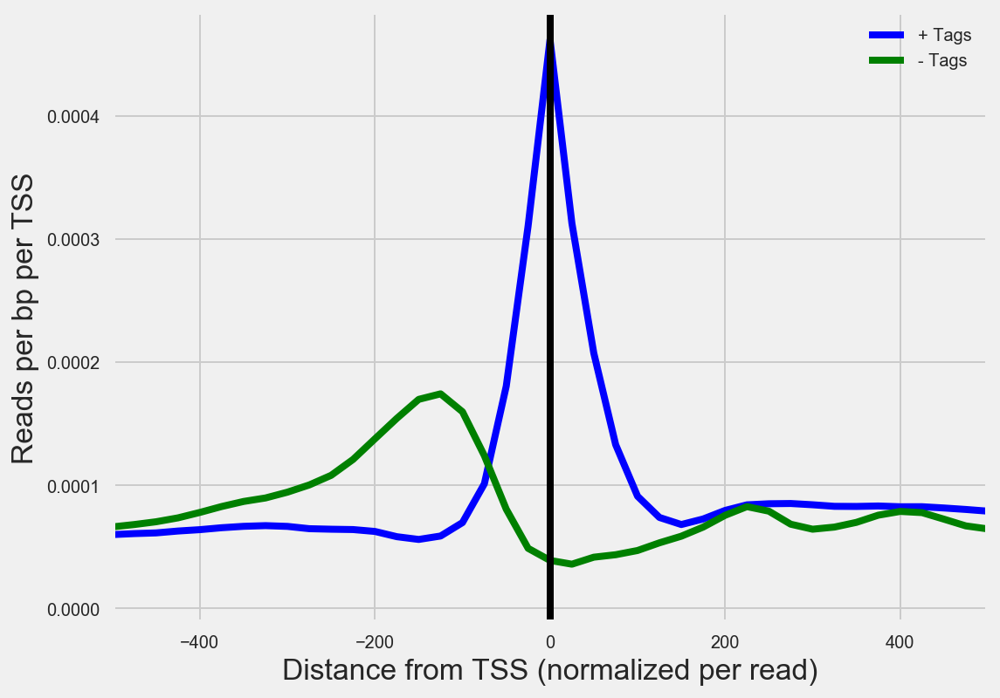

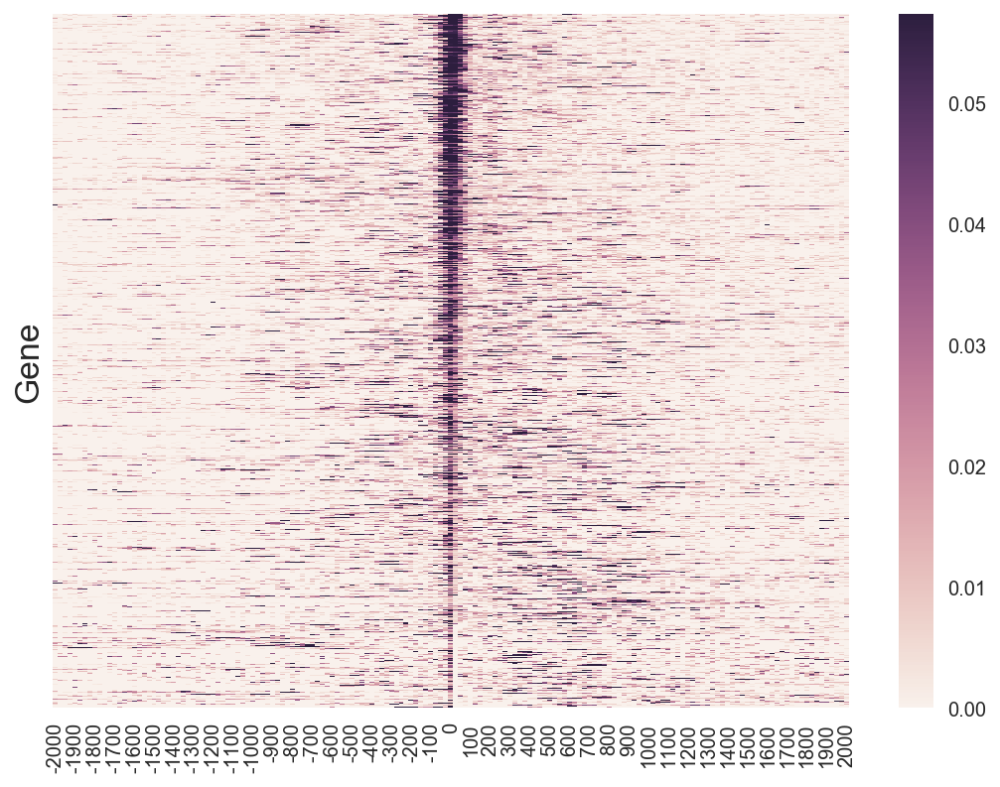

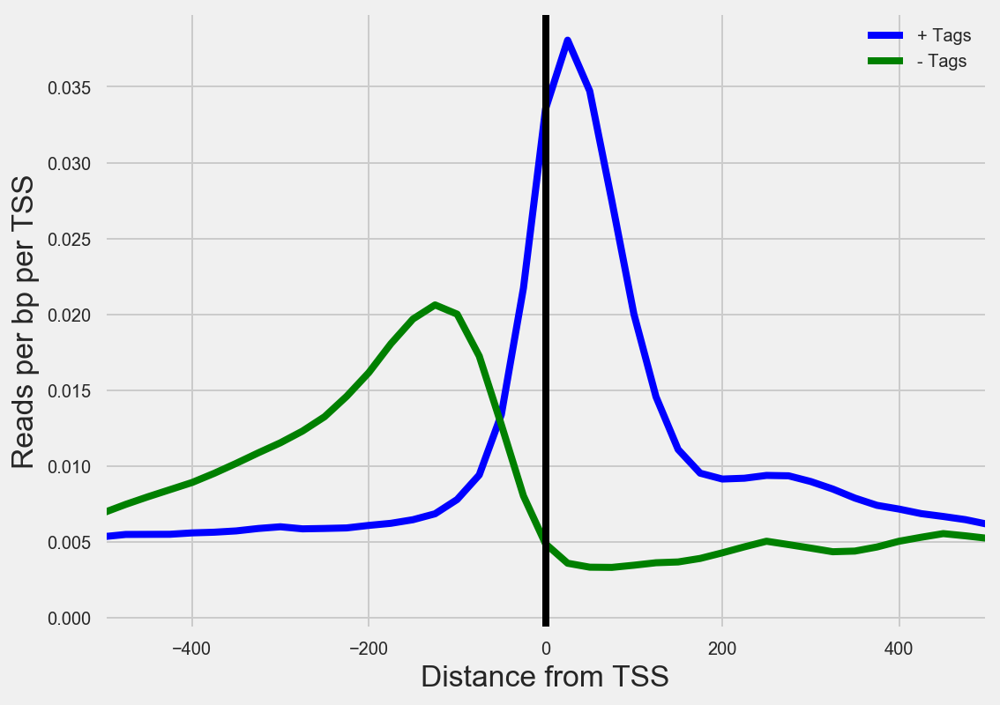

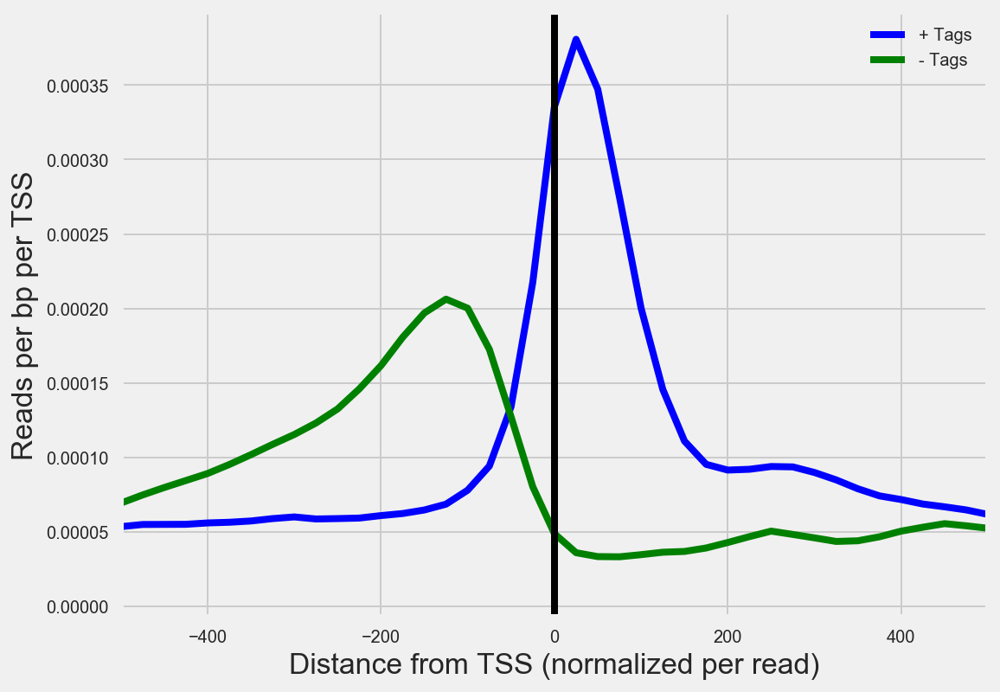

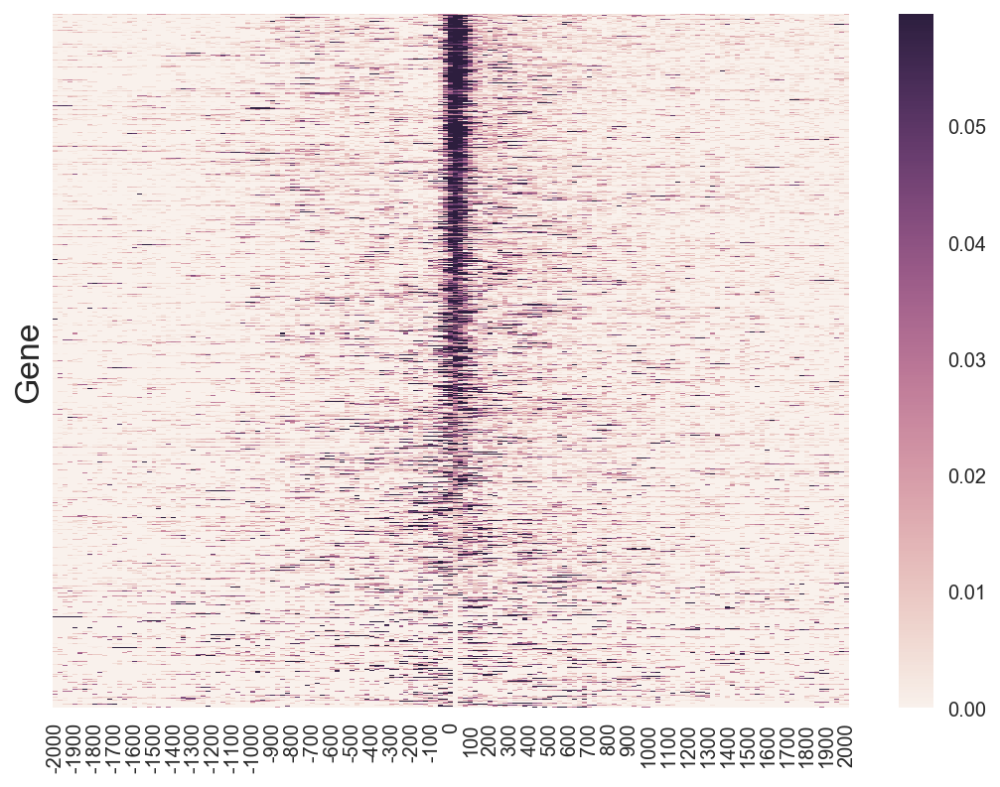

In [4]:

# Experimental 
output_file_exp = "Results/Figures/Figure3/A.exp.hist"
print('output histogram exp',output_file_exp)
hist(tag_f,output_file_exp,ref_fa,anno_gff,mode='peak',peak=peak_f,region=4000,res=25,pc=3)
hist_plot(output_file_exp)
heat_df = heat_plot(output_file_exp+'MatS',save_f = output_file_exp + '.heat.png' )

# Refseq 
output_file_mrna = "Results/Figures/Figure3/A.TSS1_mrna.hist"
input_file_mrna = save_f
print('output histogram mrna',output_file_mrna)
hist(tag_f,output_file_mrna,ref_fa,anno_gff,mode='peak',peak=save_f,region=4000,res=25,pc=3)
hist_plot(output_file_mrna)
heat_df = heat_plot(output_file_mrna+'MatS',save_f = output_file_mrna + '.heat.png' )


0.0230990739236
[-38.17659833  42.41125935]
Max value: 0.0461981478472
Full-width at half-maximum: 80.5878576849 (nts)
0.0190358773078
[ -31.47149005  103.83319628]
Max value: 0.0380717546155
Full-width at half-maximum: 135.304686333 (nts)


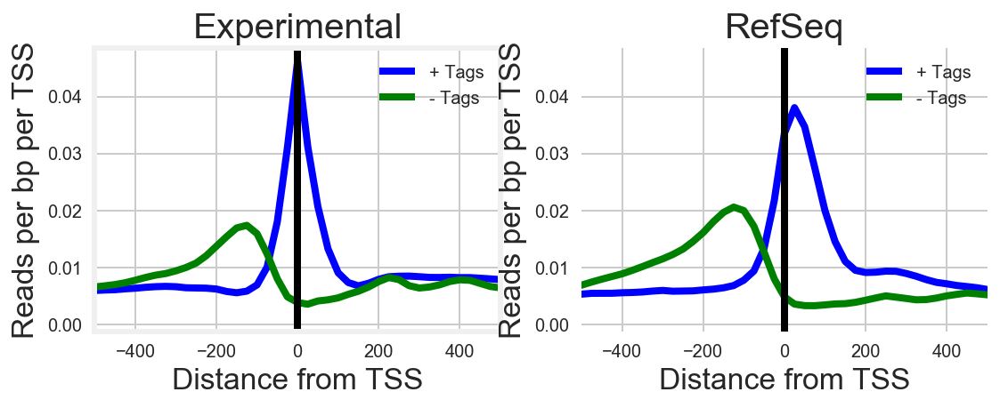

In [5]:
output_file_exp = "Results/Figures/Figure3/A.exp.hist"
output_file_mrna = "Results/Figures/Figure3/A.TSS1_mrna.hist"

wrap_hist_plot([output_file_exp ,
                output_file_mrna ], hist_save="Results/Figures/Figure3/A.combine.png",
                    names=["Experimental","RefSeq"])

0.000230980034617
[-38.17660176  42.40996037]
Max value: 0.000461960069234
Full-width at half-maximum: 80.5865621261 (nts)
0.000190350521561
[ -31.47083691  103.83103203]
Max value: 0.000380701043123
Full-width at half-maximum: 135.301868938 (nts)


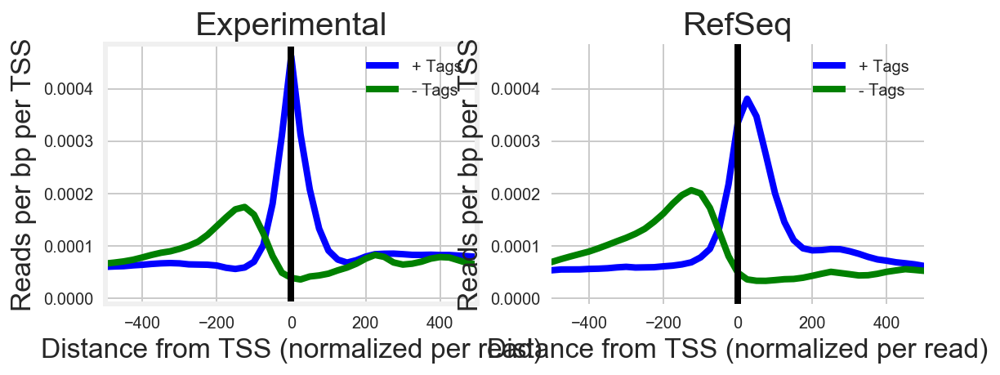

In [10]:
output_file_exp = "Results/Figures/Figure3/A.exp.hist"
output_file_mrna = "Results/Figures/Figure3/A.TSS1_mrna.hist"

wrap_hist_plot([output_file_exp ,
                output_file_mrna ], hist_save="Results/Figures/Figure3/A.combine.png",
                    names=["Experimental","RefSeq"],to_norm=True)

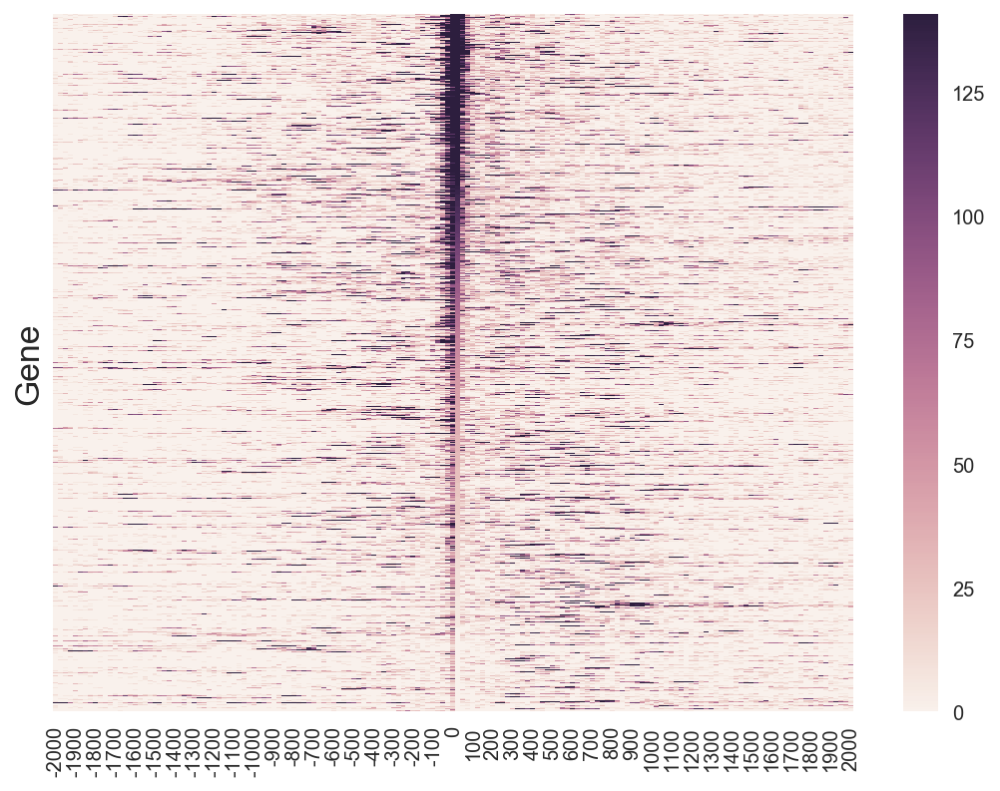

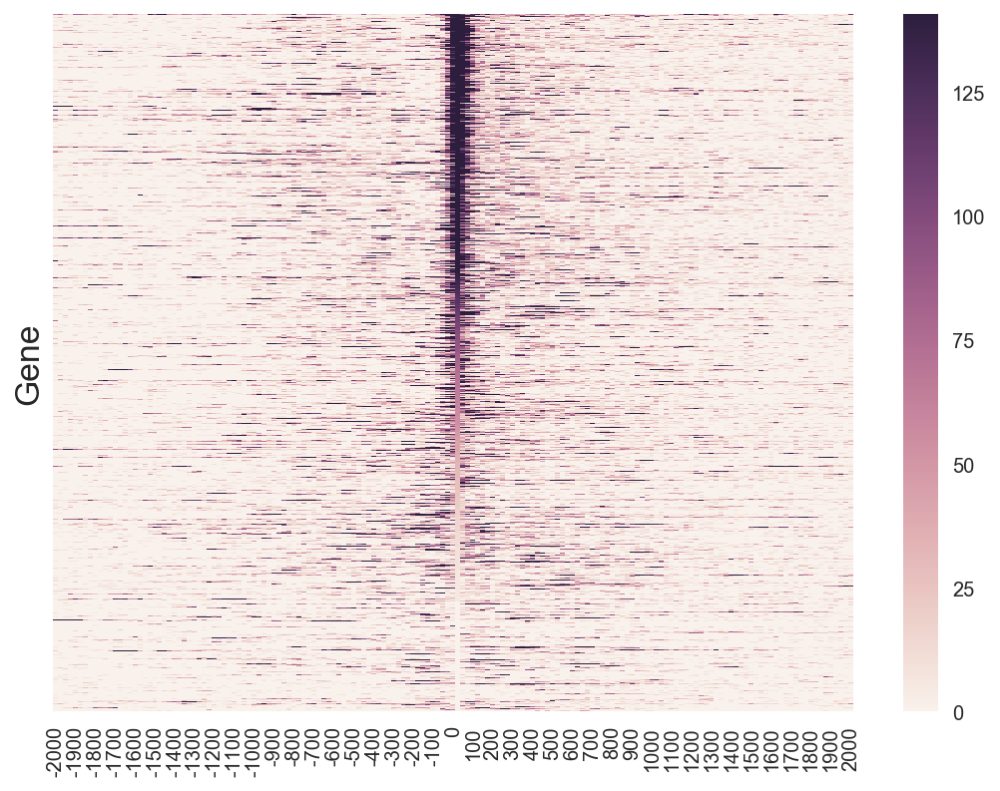

In [6]:
## Run without normalization
heat_df = heat_plot(output_file_exp+'MatS',is_norm=False,save_f = output_file_exp + '.noNorm.heat.png' )
heat_df = heat_plot(output_file_mrna+'MatS',is_norm=False,save_f = output_file_mrna + '.noNorm.heat.png' )

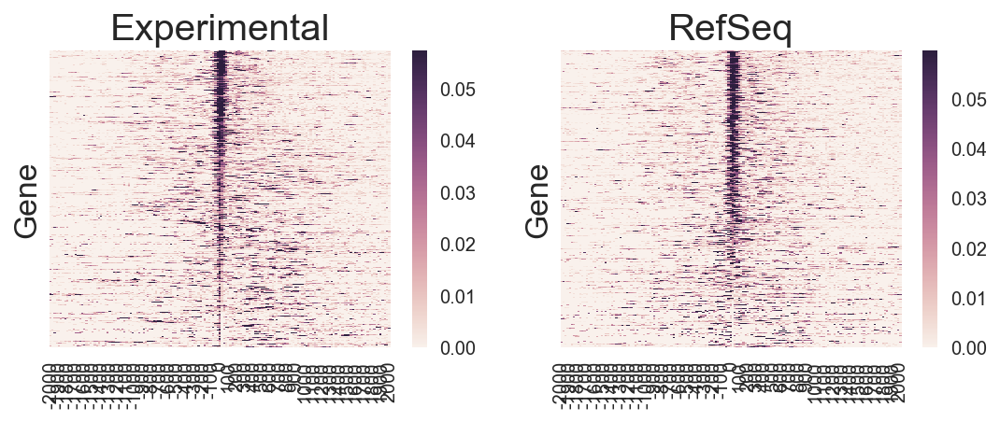

In [7]:
wrap_heat_plot([output_file_exp+'MatS',
                output_file_mrna+'MatS'], heat_save="Results/Figures/Figure3/B.combine.png",
                    names=["Experimental","RefSeq"])

In [8]:
# output_file_exp = "Results/Figures/Figure3/A.exp.hist"
# output_file_mrna = "Results/Figures/Figure3/A.TSS1_mrna.hist"

# wrap_heat_plot([output_file_exp+'MatS',
#                 output_file_mrna+'MatS'], heat_save="Results/Figures/Figure3/B.combine_full.png",
#                     names=["Experimental","RefSeq"],num_peaks=100000)

In [4]:
## Create RefSeq peak file for this
peak_f = "Results/output/TSS1.exp.bed"
meta_f = "Results/output/TSS1.exp.meta"

i = peak_f
tag_f = "Results/merged/tags_TSS_merged"
mrna_filt = "Results/Figures/Figure3/A.mrna"
peakFileToPeakFile(mRNA_peak_file,i,distance=1000,f_save=mrna_filt,is_peak=False,is_bed=True)


,transcript_id,Chr,Start,End,Strand,actual_start,ID,Parent,Dbxref,Name,gbkey,gene,model_evidence,product,Note,exception,end_range,partial,start_range,inference
0,XM_027386529.1,NW_020822366.1,722307,722309,-,722308,rna7,gene4,"GeneID:100754303,Genbank:XM_027386529.1",XM_027386529.1,mRNA,Bmp4,Supporting evidence includes similarity to: 29...,bone morphogenetic protein 4%2C transcript var...,NaN,NaN,NaN,NaN,NaN,NaN
1,XM_027386530.1,NW_020822366.1,722307,722309,-,722308,rna8,gene4,"GeneID:100754303,Genbank:XM_027386530.1",XM_027386530.1,mRNA,Bmp4,Supporting evidence includes similarity to: 29...,bone morphogenetic protein 4%2C transcript var...,NaN,NaN,NaN,NaN,NaN,NaN
2,XM_027386528.1,NW_020822366.1,724609,724611,-,724610,rna6,gene4,"GeneID:100754303,Genbank:XM_027386528.1",XM_027386528.1,mRNA,Bmp4,Supporting evidence includes similarity to: 29...,bone morphogenetic protein 4%2C transcript var...,NaN,NaN,NaN,NaN,NaN,NaN
3,XM_027386531.1,NW_020822366.1,1085434,1085436,+,1085435,rna10,gene6,"GeneID:100752216,Genbank:XM_027386531.1",XM_027386531.1,mRNA,Cdkn3,Supporting evidence includes similarity to: 5 ...,cyclin dependent kinase inhibitor 3%2C transcr...,NaN,NaN,NaN,NaN,NaN,NaN
4,XM_027386532.1,NW_020822366.1,1085434,1085436,+,1085435,rna11,gene6,"GeneID:100752216,Genbank:XM_027386532.1",XM_027386532.1,mRNA,Cdkn3,Supporting evidence includes similarity to: 2 ...,cyclin dependent kinase inhibitor 3%2C transcr...,NaN,NaN,NaN,NaN,NaN,NaN
5,XM_027386533.1,NW_020822366.1,1085743,1085745,+,1085744,rna12,gene6,"GeneID:100752216,Genbank:XM_027386533.1",XM_027386533.1,mRNA,Cdkn3,Supporting evidence includes similarity to: 1 ...,cyclin dependent kinase inhibitor 3%2C transcr...,NaN,NaN,NaN,NaN,NaN,NaN
6,XM_027386534.1,NW_020822366.1,1114412,1114414,-,1114413,rna13,gene7,"GeneID:103160710,Genbank:XM_027386534.1",XM_027386534.1,mRNA,Cnih1,Supporting evidence includes similarity to: 10...,cornichon family AMPA receptor auxiliary prote...,NaN,NaN,NaN,NaN,NaN,NaN
8,XM_027386536.1,NW_020822366.1,1159882,1159884,+,1159883,rna15,gene10,"GeneID:100751644,Genbank:XM_027386536.1",XM_027386536.1,mRNA,Cgrrf1,Supporting evidence includes similarity to: 7 ...,cell growth regulator with ring finger domain 1,NaN,NaN,NaN,NaN,NaN,NaN
9,XM_027386537.1,NW_020822366.1,1214840,1214842,+,1214841,rna16,gene11,"GeneID:100750960,Genbank:XM_027386537.1",XM_027386537.1,mRNA,Samd4a,Supporting evidence includes similarity to: 17...,sterile alpha motif domain containing 4A%2C tr...,NaN,NaN,NaN,NaN,NaN,NaN
10,XM_027386538.1,NW_020822366.1,1214842,1214844,+,1214843,rna17,gene11,"GeneID:100750960,Genbank:XM_027386538.1",XM_027386538.1,mRNA,Samd4a,Supporting evidence includes similarity to: 11...,sterile alpha motif domain containing 4A%2C tr...,NaN,NaN,NaN,NaN,NaN,NaN


('output histogram mrna', 'Results/Figures/Figure3/A.mrna.hist')
annotatePeaks.pl Results/Figures/Figure3/A.mrnafilt /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -d Results/merged/tags_TSS_merged -pc 3 > Results/Figures/Figure3/A.mrna.hist
annotatePeaks.pl Results/Figures/Figure3/A.mrnafilt /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -histNorm 100 -d Results/merged/tags_TSS_merged -pc 3 > Results/Figures/Figure3/A.mrna.histNorm
annotatePeaks.pl Results/Figures/Figure3/A.mrnafilt /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -ghist -d Results/merged/tags_TSS_merged -pc 3 -strand + > 

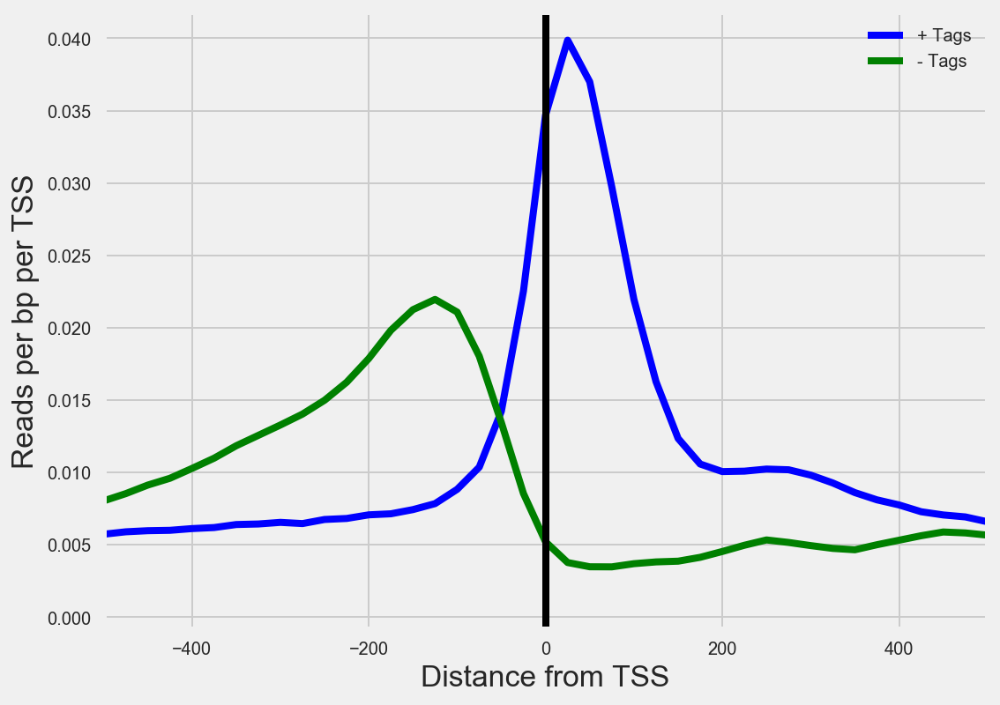

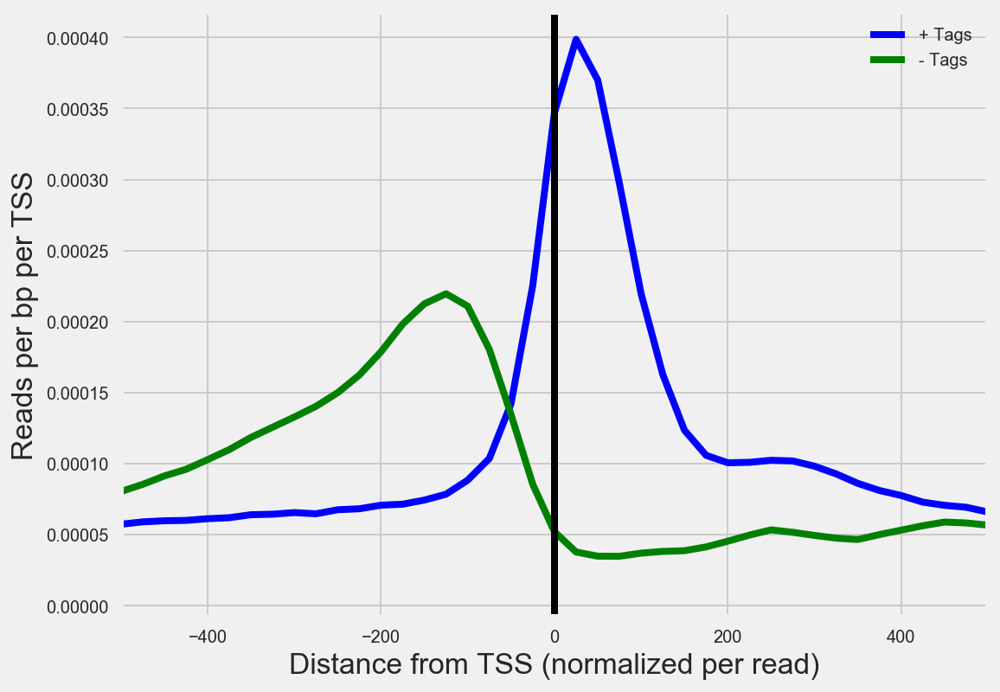

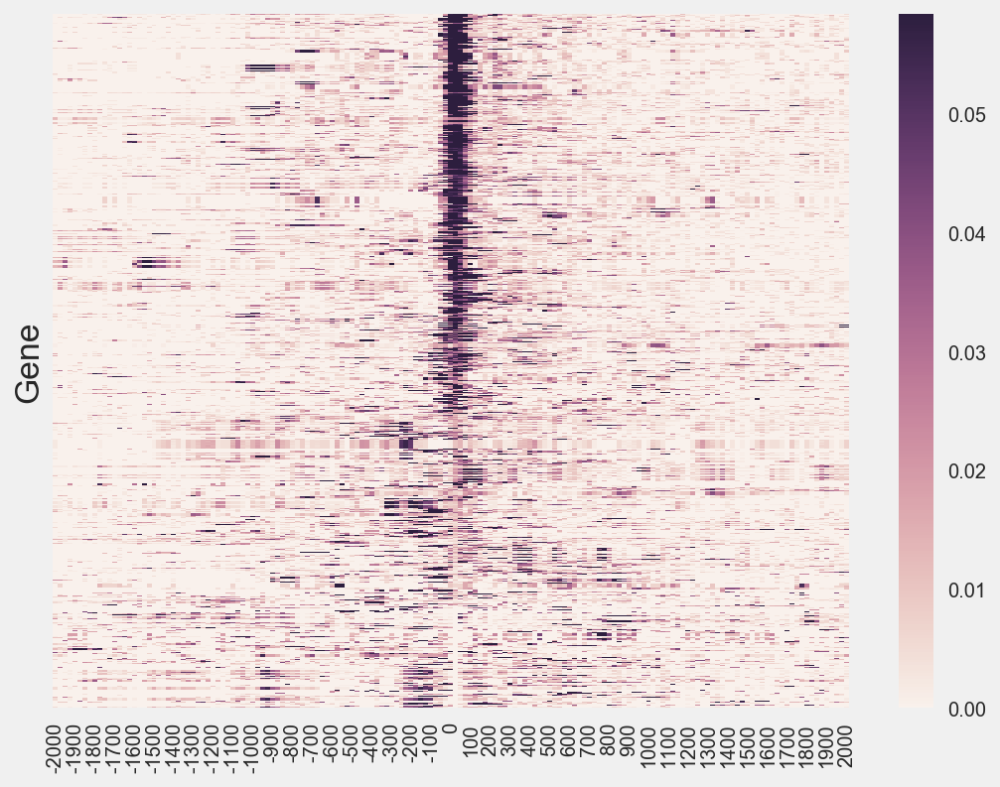

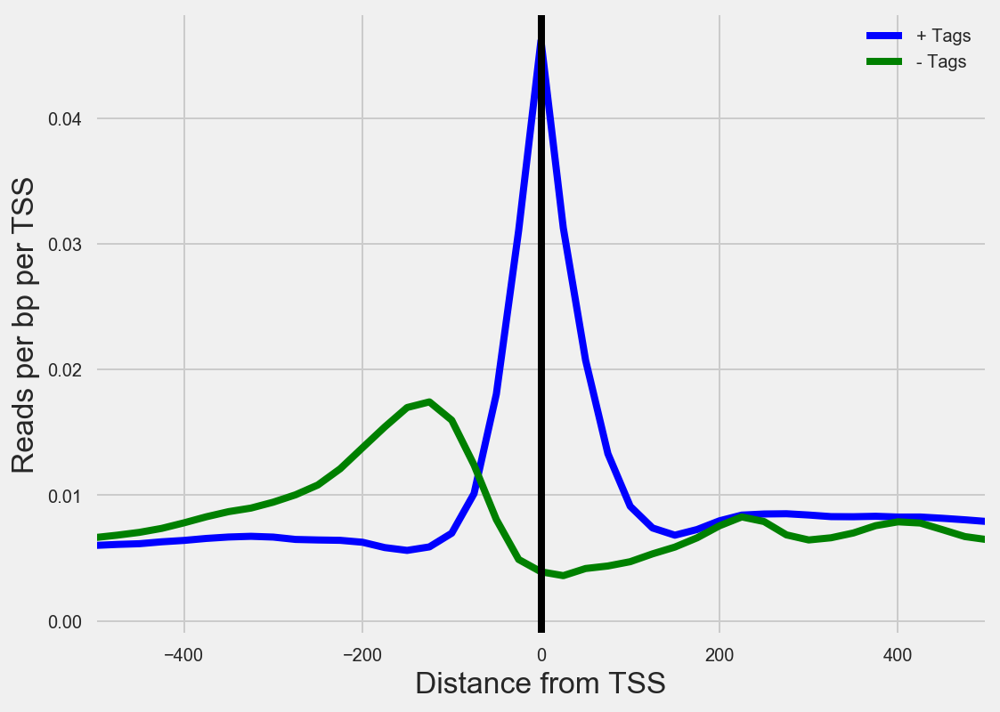

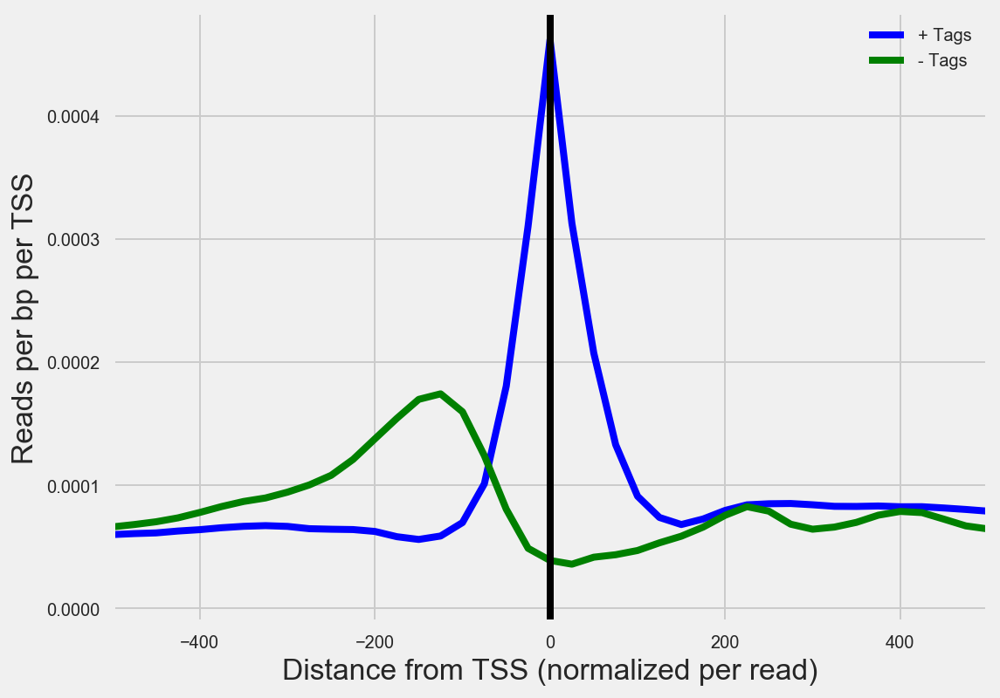

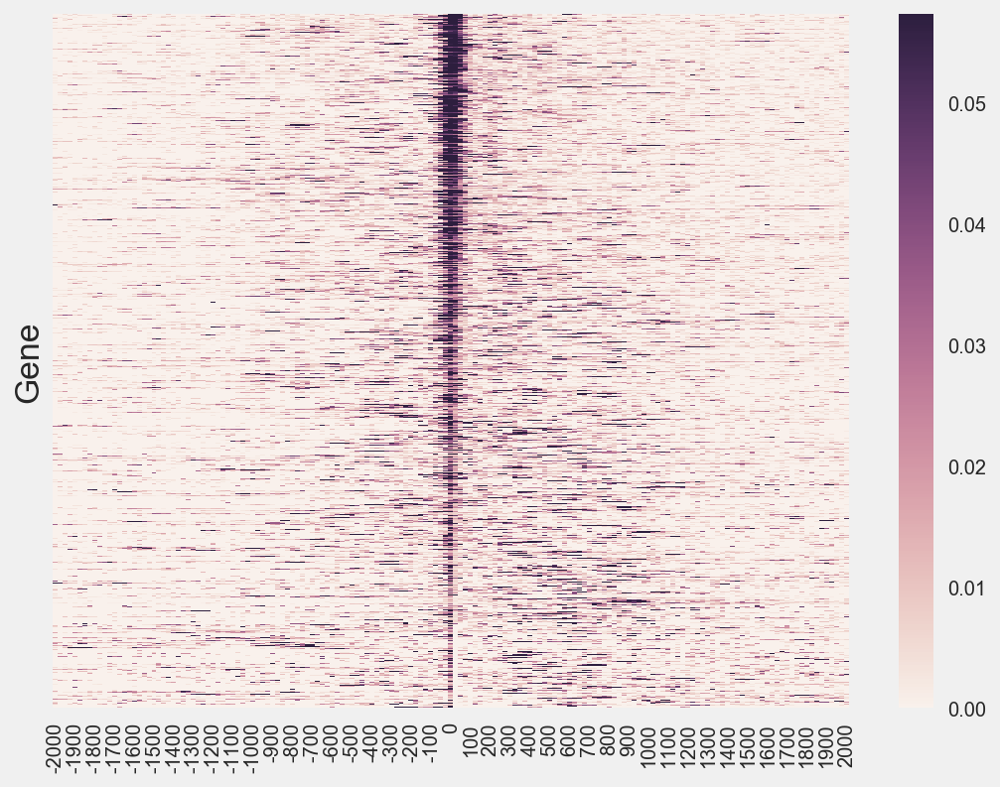

In [5]:
# Refseq 
output_file_mrna = "Results/Figures/Figure3/A.mrna.hist"
print('output histogram mrna',output_file_mrna)
hist(tag_f,output_file_mrna,ref_fa,anno_gff,mode='peak',peak=mrna_filt+'filt',region=4000,res=25,pc=3)
hist_plot(output_file_mrna)
heat_plot(output_file_mrna+'MatS',save_f = output_file_mrna + '.heat.png' )

# Experimental 
output_file_exp = "Results/Figures/Figure3/A.exp.hist"
print('output histogram exp',output_file_exp)
hist(tag_f,output_file_exp,ref_fa,anno_gff,mode='peak',peak=peak_f,region=4000,res=25,pc=3)
hist_plot(output_file_exp)
heat_df = heat_plot(output_file_exp+'MatS',save_f = output_file_exp + '.heat.png' )

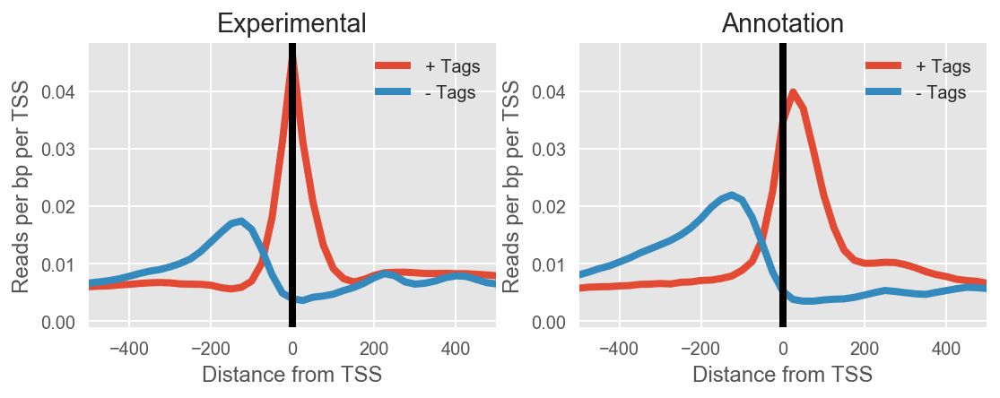

In [3]:
output_file_exp = "Results/Figures/Figure3/A.exp.hist"
output_file_mrna = "Results/Figures/Figure3/A.mrna.hist"

wrap_hist_plot([output_file_exp ,
                output_file_mrna ], hist_save="Results/Figures/Figure3/A.combine.png",
                    names=["Experimental","Annotation"])

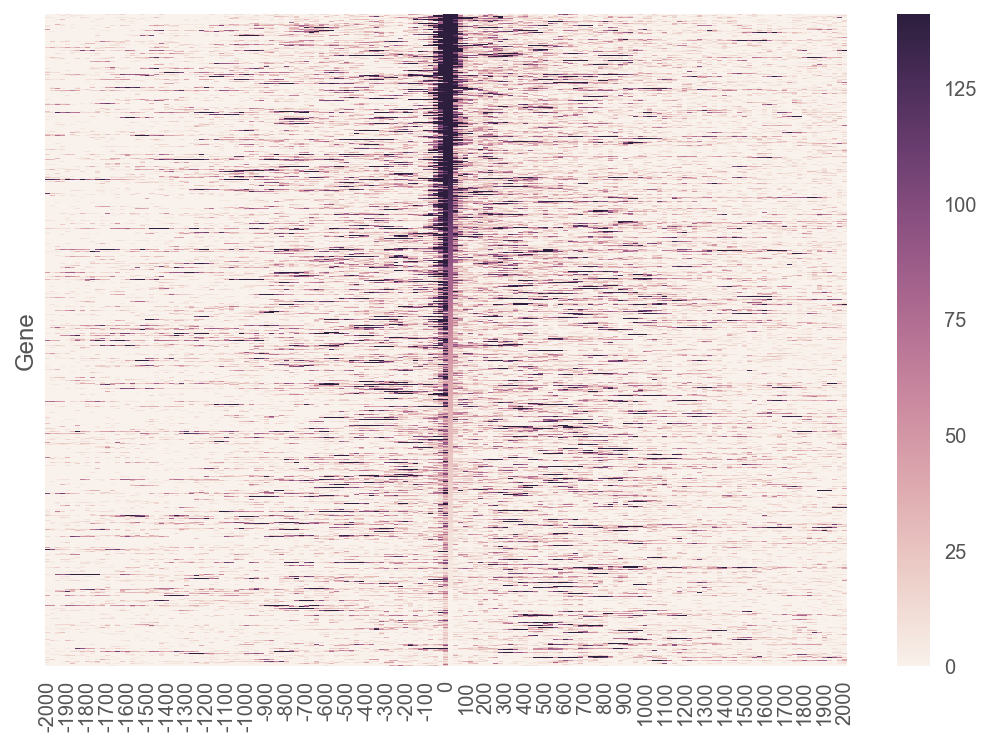

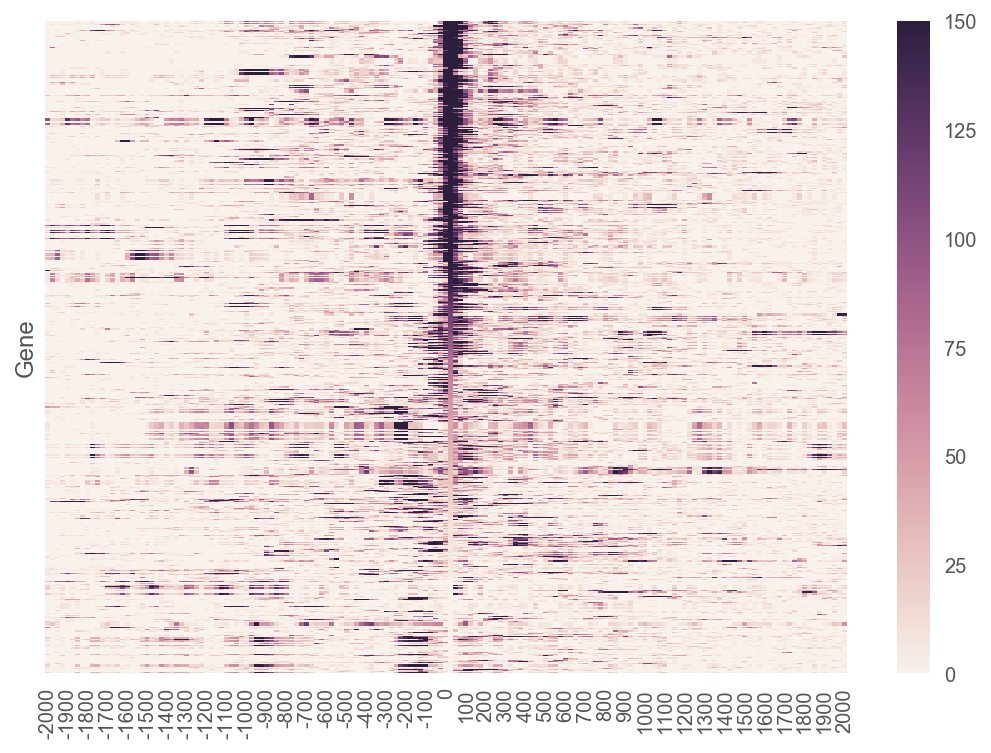

In [19]:
## Run without normalization
heat_df = heat_plot(output_file_exp+'MatS',is_norm=False,save_f = output_file_exp + '.noNorm.heat.png' )
heat_df = heat_plot(output_file_mrna+'MatS',is_norm=False,save_f = output_file_exp + '.noNorm.heat.png' )

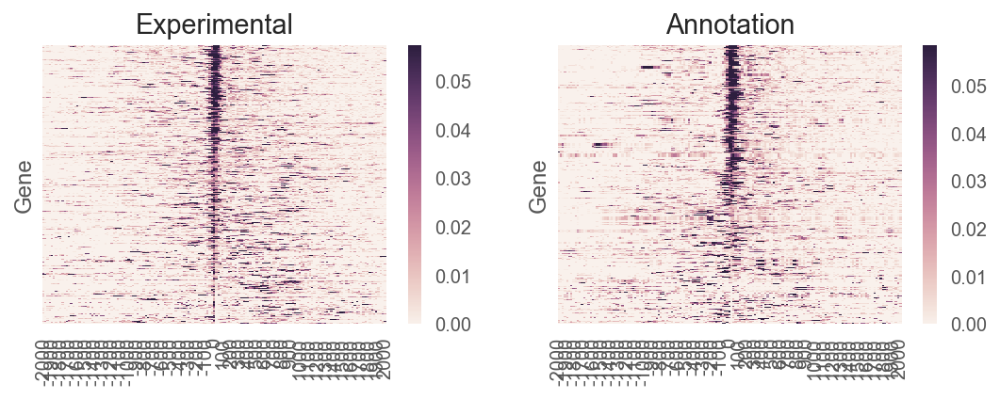

In [20]:
output_file_exp = "Results/Figures/Figure3/A.exp.hist"
output_file_mrna = "Results/Figures/Figure3/A.mrna.hist"

wrap_heat_plot([output_file_exp+'MatS',
                output_file_mrna+'MatS'], heat_save="Results/Figures/Figure3/B.combine.png",
                    names=["Experimental","Annotation"])

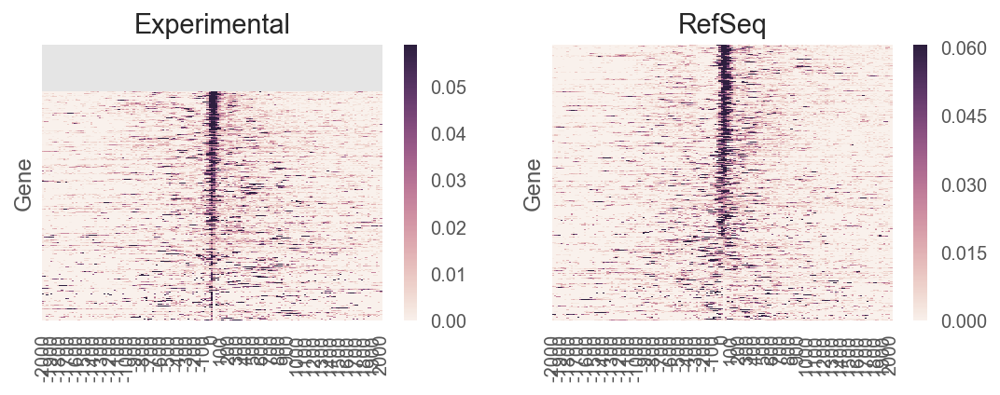

In [21]:
output_file_exp = "Results/Figures/Figure3/A.exp.hist"
output_file_mrna = "Results/Figures/Figure3/A.mrna.hist"

wrap_heat_plot([output_file_exp+'MatS',
                output_file_mrna+'MatS'], heat_save="Results/Figures/Figure3/B.combine_full.png",
                    names=["Experimental","RefSeq"],num_peaks=100000)

## ii. Tags from CHO GRO-Cap

0.0230990739236
[-38.17659833  42.41125935]


80.587857684920195

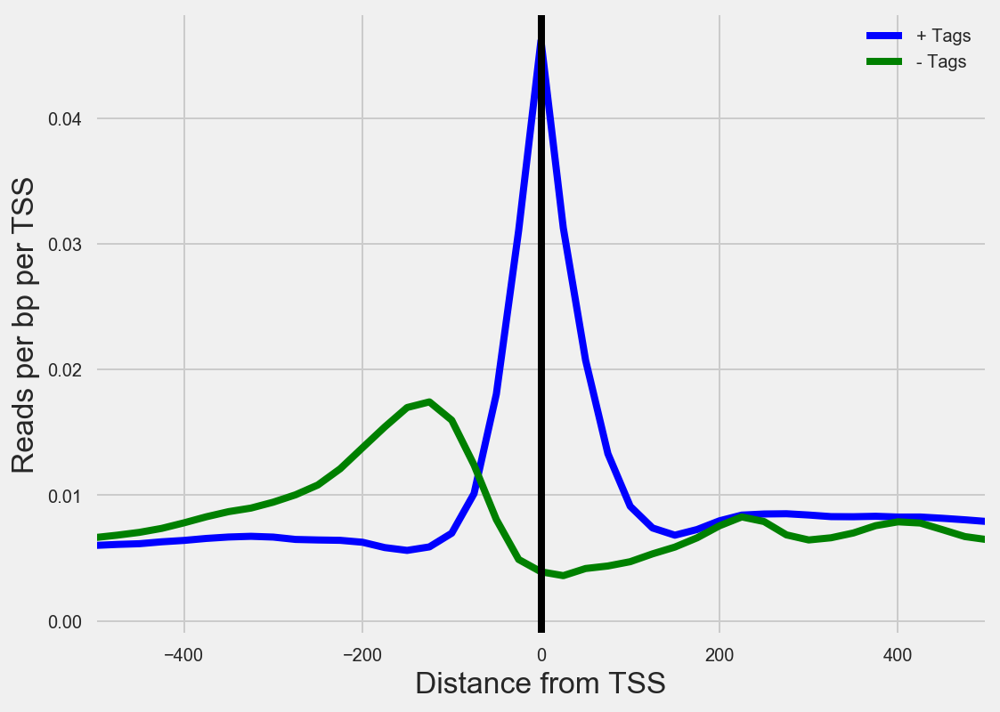

In [11]:
output_file_exp = "Results/Figures/Figure3/A.exp.hist"

# df = pd.read_csv(output_file_exp,sep="\t",index_col=0)
# df.iloc[df.shape[0]/2-10:df.shape[0]/2+10]


df = pd.read_csv(output_file_exp,sep='\t',header=0,names=['Distance from TSS','Coverage','+ Tags','- Tags'])
plt.plot(df['Distance from TSS'],df['+ Tags'],label='+ Tags')
plt.plot(df['Distance from TSS'],df['- Tags'],label='- Tags')
plt.xlim([-500,500])
plt.xlabel('Distance from TSS')
plt.ylabel('Reads per bp per TSS')
plt.axvline(x=0,c='k')
plt.legend(loc='upper right')

helper.fwhm(df["Distance from TSS"], df['+ Tags'], k=3)


In [12]:
# Refseq 

peak_f = "Results/output/TSS1.exp.bed"
i = peak_f
tag_f = os.path.join(data_folder,"CHO/GROCap/f03_tags/trim_CHO_GROCap1")



## Create RefSeq peak file for this
mrna_filt = "Results/Figures/Figure3/A_ii.mrna"
peakFileToPeakFile(mRNA_peak_file,i,distance=1000,f_save=mrna_filt,is_peak=False,is_bed=True)
#create_output.exp_bed_to_refseq(peak_f,meta_f,refseq_f=mRNA_peak_file,save_f=save_f,is_unique=True)


output_file_mrna = "Results/Figures/Figure3/A_ii.mrna.hist"
print('output histogram mrna',output_file_mrna)
hist(tag_f,output_file_mrna,ref_fa,anno_gff,mode='peak',peak=mrna_filt,region=4000,res=25,pc=3)
hist_plot(output_file_mrna)
heat_plot(output_file_mrna+'MatS',save_f = output_file_mrna + '.heat.png' )

# Experimental 
output_file_exp = "Results/Figures/Figure3/A_ii.exp.hist"
print('output histogram exp',output_file_exp)
hist(tag_f,output_file_exp,ref_fa,anno_gff,mode='peak',peak=peak_f,region=4000,res=25,pc=3)
hist_plot(output_file_exp)
heat_df = heat_plot(output_file_exp+'MatS',save_f = output_file_exp + '.heat.png' )

('output histogram mrna', 'Results/Figures/Figure3/A_ii.mrna.hist')
annotatePeaks.pl Results/Figures/Figure3/A_ii.mrna /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -d /data/isshamie/TSS/NCBI_PICR_103_Processed/CHO/GROCap/f03_tags/trim_CHO_GROCap1 -pc 3 > Results/Figures/Figure3/A_ii.mrna.hist
annotatePeaks.pl Results/Figures/Figure3/A_ii.mrna /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -histNorm 100 -d /data/isshamie/TSS/NCBI_PICR_103_Processed/CHO/GROCap/f03_tags/trim_CHO_GROCap1 -pc 3 > Results/Figures/Figure3/A_ii.mrna.histNorm
annotatePeaks.pl Results/Figures/Figure3/A_ii.mrna /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_

NoPeaksFound: No proper peaks were found in the data set; likely the dataset is flat (e.g. all zeros).

('output histogram mrna', 'Results/Figures/Figure3/A_ii.TSS1_mrna.hist')
annotatePeaks.pl Results/Figures/Figure3/A_ii.mrna /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -d /data/isshamie/TSS/NCBI_PICR_103_Processed/CHO/GROCap/f03_tags/trim_CHO_GROCap1 -pc 3 > Results/Figures/Figure3/A_ii.TSS1_mrna.hist
annotatePeaks.pl Results/Figures/Figure3/A_ii.mrna /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_CriGri-PICR_top_level.gff3 -fragLength 1 -size 4000 -hist 25 -histNorm 100 -d /data/isshamie/TSS/NCBI_PICR_103_Processed/CHO/GROCap/f03_tags/trim_CHO_GROCap1 -pc 3 > Results/Figures/Figure3/A_ii.TSS1_mrna.histNorm
annotatePeaks.pl Results/Figures/Figure3/A_ii.mrna /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -gff /data/isshamie/genome/ncbi_anno_103/alt_C

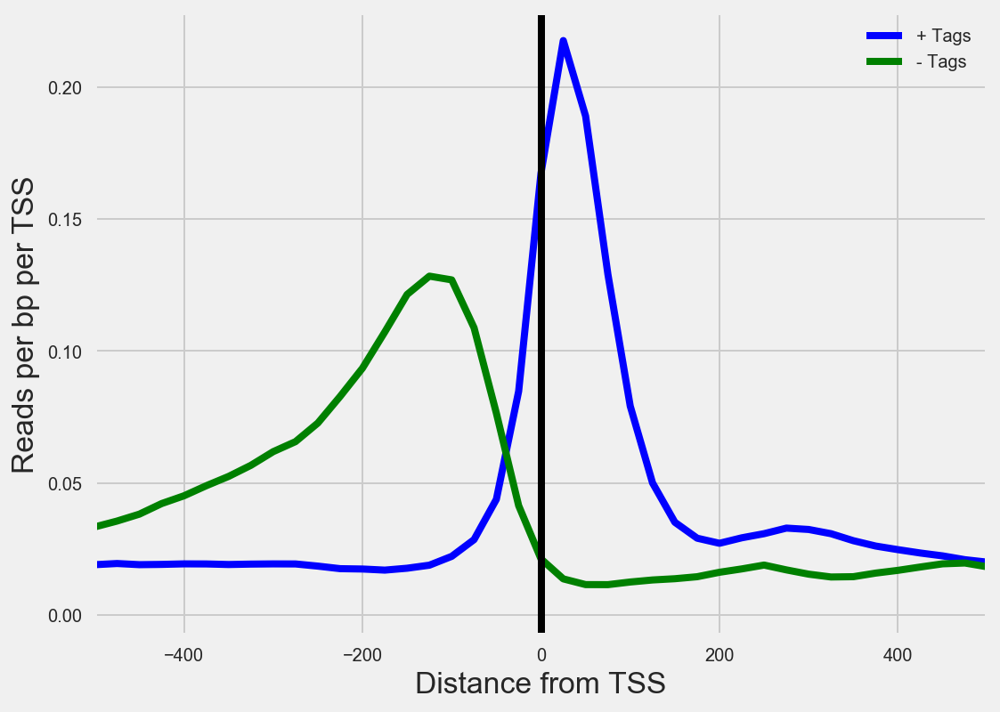

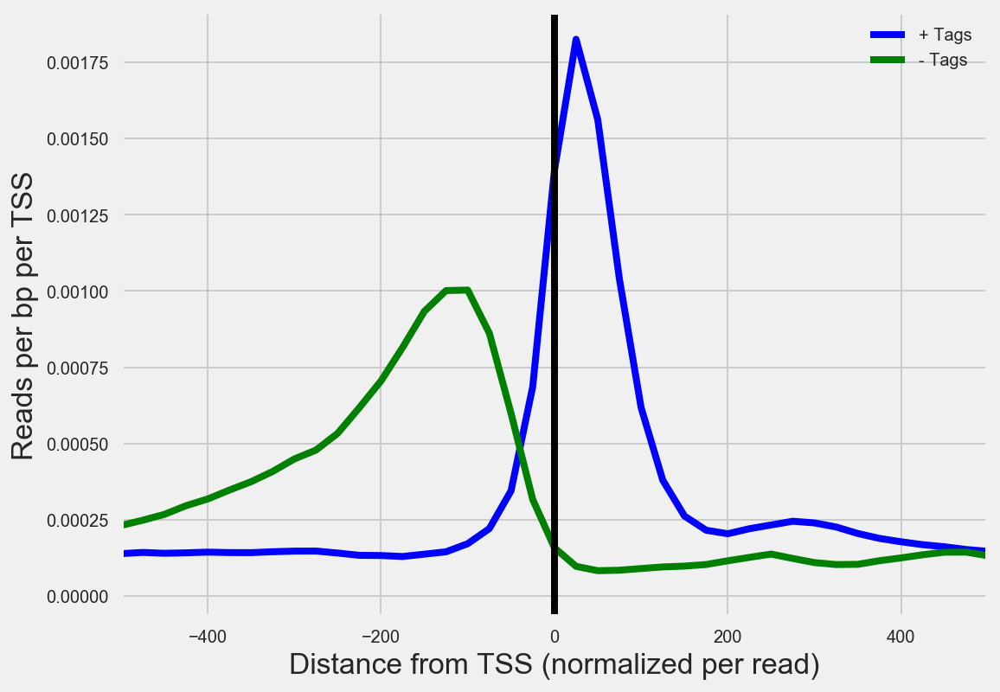

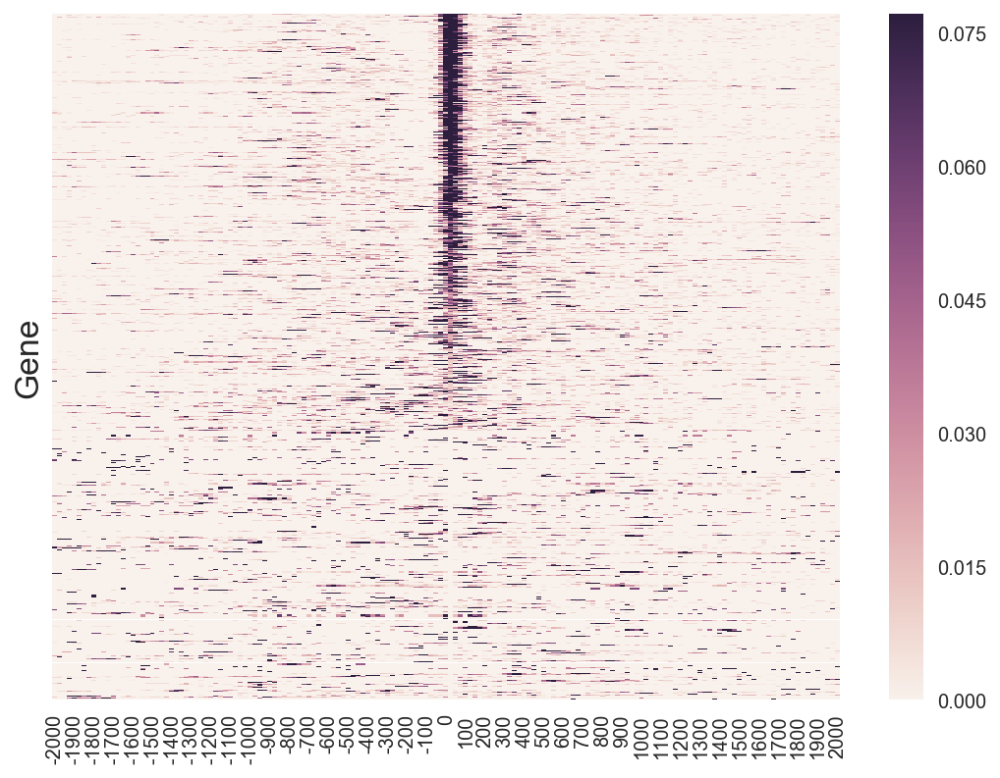

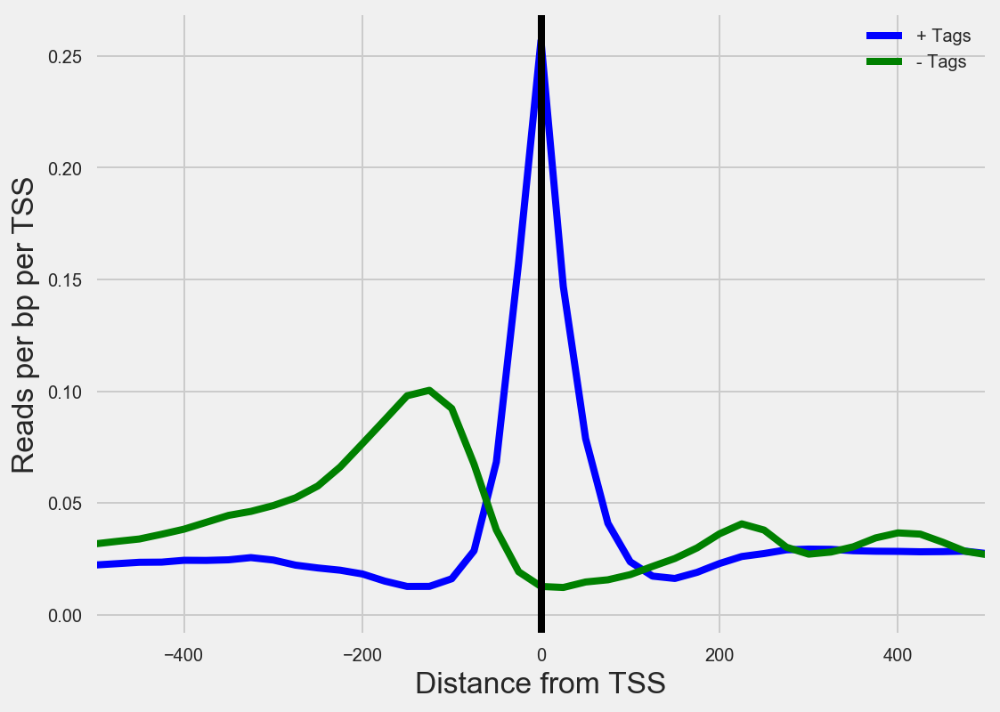

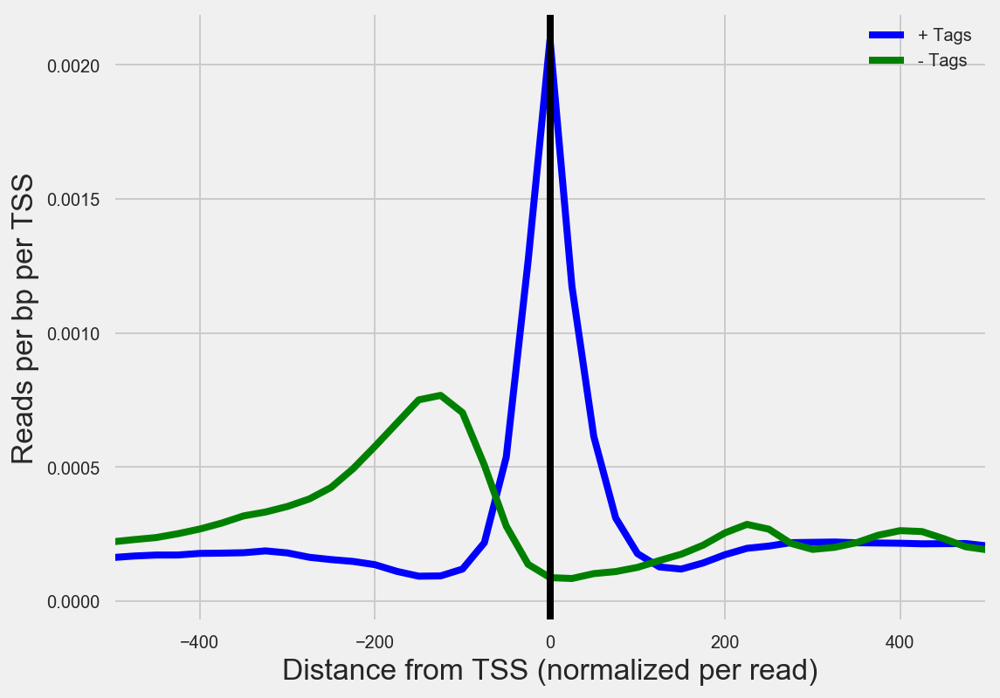

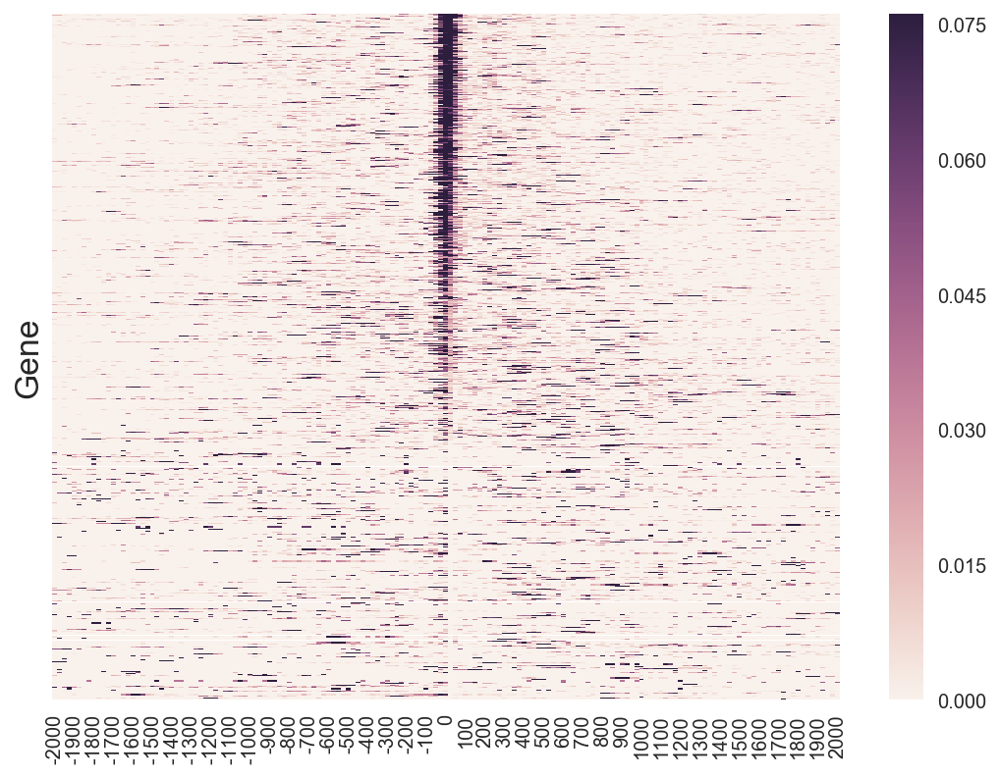

In [14]:
## Create RefSeq peak file for this
peak_f = "Results/output/TSS1.exp.bed"
meta_f = "Results/output/TSS1.exp.meta"
mrna_filt = "Results/Figures/Figure3/A_ii.mrna"
save_f = mrna_filt
tag_f = os.path.join(data_folder,"CHO/GROCap/f03_tags/trim_CHO_GROCap1")

# Refseq 
## Create RefSeq peak file for this
create_output.exp_bed_to_refseq(peak_f,meta_f,refseq_f=mRNA_peak_file,save_f=save_f,is_unique=True)


output_file_mrna = "Results/Figures/Figure3/A_ii.TSS1_mrna.hist"
print('output histogram mrna',output_file_mrna)
hist(tag_f,output_file_mrna,ref_fa,anno_gff,mode='peak',peak=mrna_filt,region=4000,res=25,pc=3)
hist_plot(output_file_mrna)
heat_plot(output_file_mrna+'MatS',save_f = output_file_mrna + '.heat.png' )

# Experimental 
output_file_exp = "Results/Figures/Figure3/A_ii.exp.hist"
print('output histogram exp',output_file_exp)
hist(tag_f,output_file_exp,ref_fa,anno_gff,mode='peak',peak=peak_f,region=4000,res=25,pc=3)
hist_plot(output_file_exp)
heat_df = heat_plot(output_file_exp+'MatS',save_f = output_file_exp + '.heat.png' )

## iii. Peaks 

# Panel C. Nucleotide Sequences of Experimental TSS vs RefSeq TSS

## i. 

In [10]:
from Homer import *

annotatePeaks.pl Results/output/TSS1.exp.bed /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 1000 -hist 1 -di > Results/output/TSS1.exp.bed_nucl
annotatePeaks.pl Results/Figures/Figure3/alt/A.TSS1_mrna /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 1000 -hist 1 -di > Results/Figures/Figure3/alt/A.TSS1_mrna_nucl


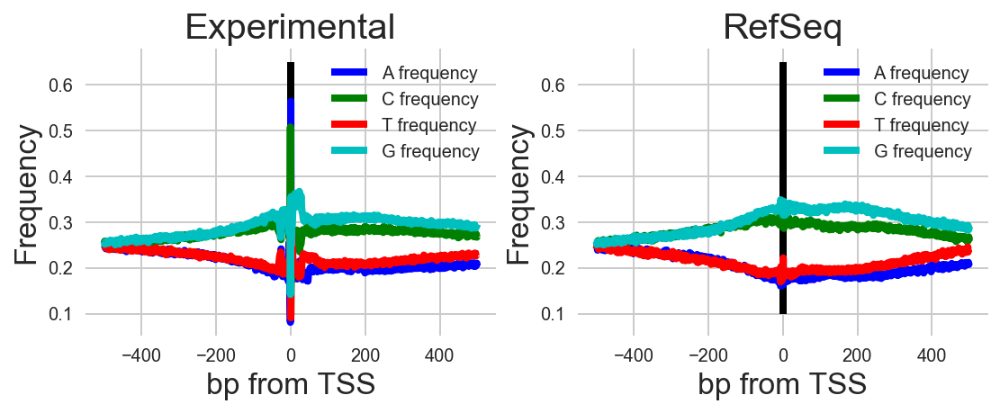

In [41]:
f1 = "Results/output/TSS1.exp.bed"
f2 = "Results/Figures/Figure3/alt/A.TSS1_mrna"
f = plt.figure()
wrap_plots([f1,f2],homer_nucleotide,"Results/Figures/Figure3/C.combine",["Experimental","RefSeq"],ref_fa,1000,(0.1,0.65),False)

annotatePeaks.pl Results/output/TSS1.exp.bed /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 200 -hist 1 -di > Results/output/TSS1.exp.bed_nucl
annotatePeaks.pl Results/Figures/Figure3/alt/A.TSS1_mrna /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 200 -hist 1 -di > Results/Figures/Figure3/alt/A.TSS1_mrna_nucl


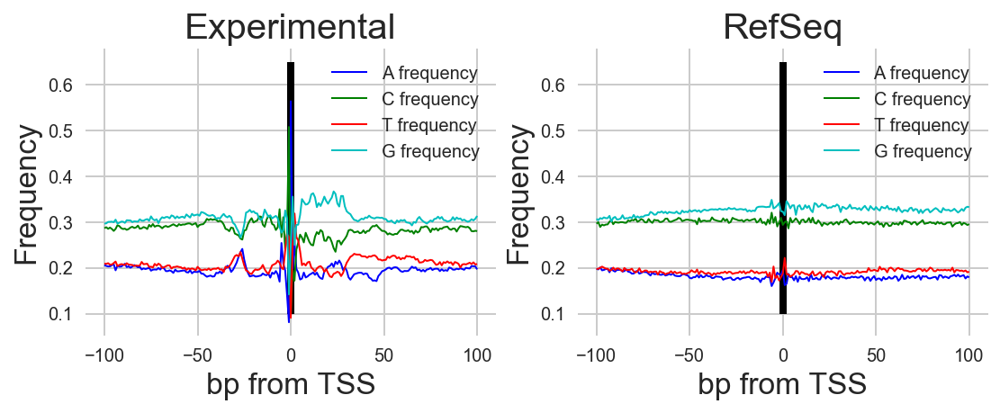

In [2]:
f1 = "Results/output/TSS1.exp.bed"
f2 = "Results/Figures/Figure3/alt/A.TSS1_mrna"

f = plt.figure()
wrap_plots([f1,f2],homer_nucleotide,"Results/Figures/Figure3/C_200.combine",["Experimental","RefSeq"],ref_fa,200,(0.1,0.65),False)

annotatePeaks.pl Results/Figures/Figure3/A.mrnafilt /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 200 -hist 1 -di > Results/Figures/Figure3/C_i_refseq.nuc_freq_200.txt


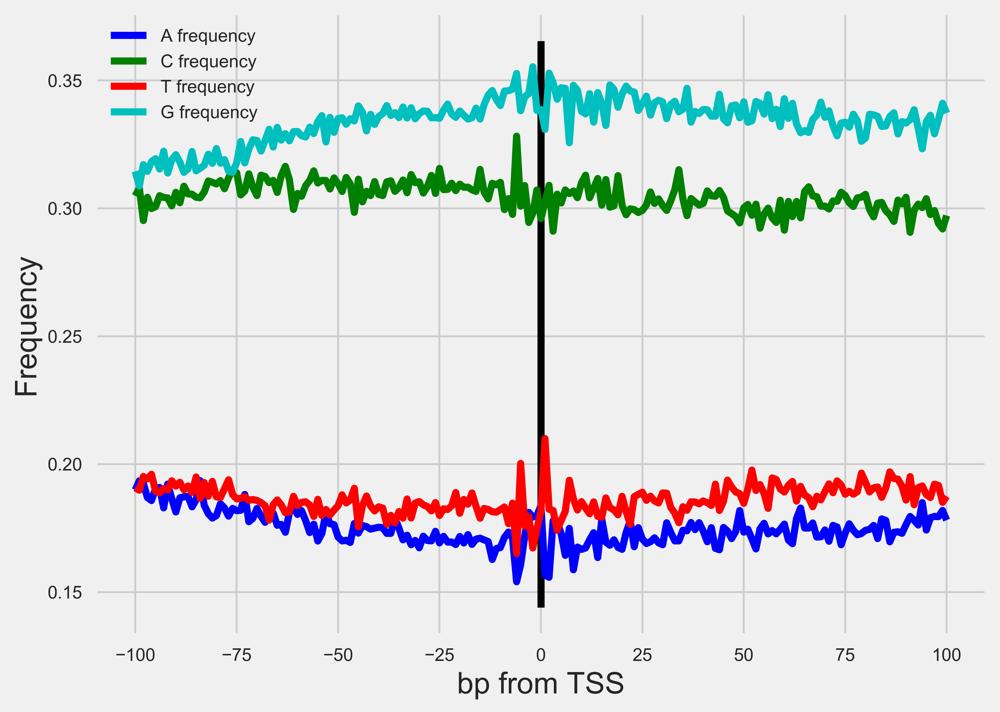

In [8]:
mrna_filt = "Results/Figures/Figure3/A.mrna"
homer_nucleotide(mrna_filt+'filt',
    'Results/Figures/Figure3/C_i_refseq.nuc_freq_200.txt',
    ref_fa,
    size=200)

annotatePeaks.pl Results/output/TSS1.exp.bed /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 200 -hist 1 -di > Results/Figures/Figure3/C_i_exp.nuc_freq_200.txt


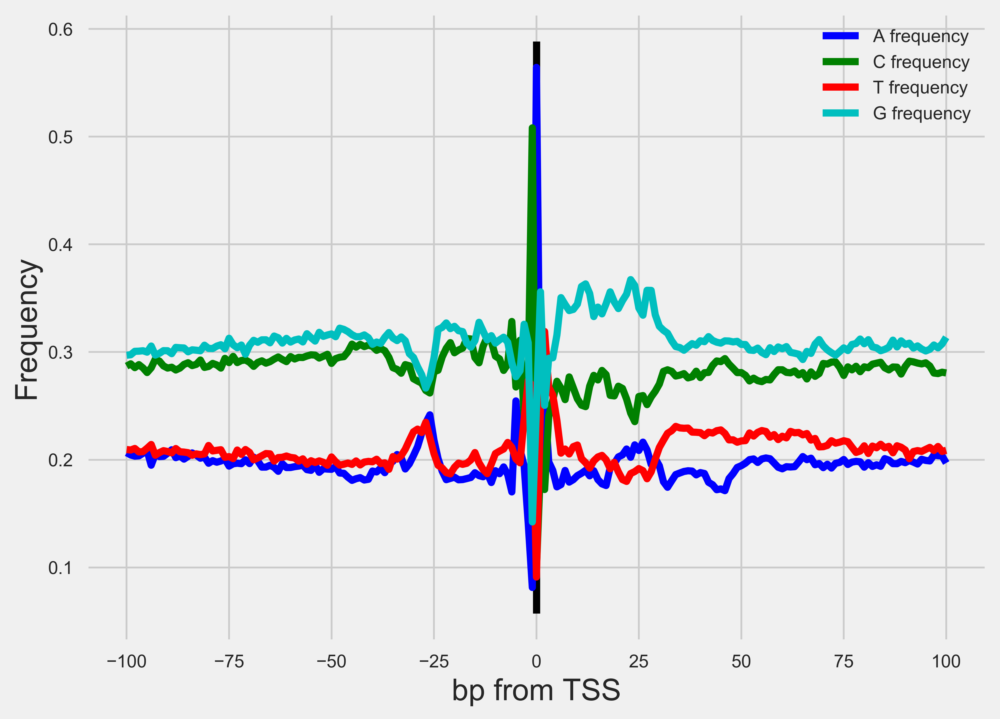

In [15]:
homer_nucleotide("Results/output/TSS1.exp.bed",
    'Results/Figures/Figure3/C_i_exp.nuc_freq_200.txt',
    ref_fa,
    size=200)

annotatePeaks.pl Results/output/TSS1.exp.bed /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 1000 -hist 1 -di > Results/Figures/Figure3/C_i_exp.nuc_freq_1000.txt


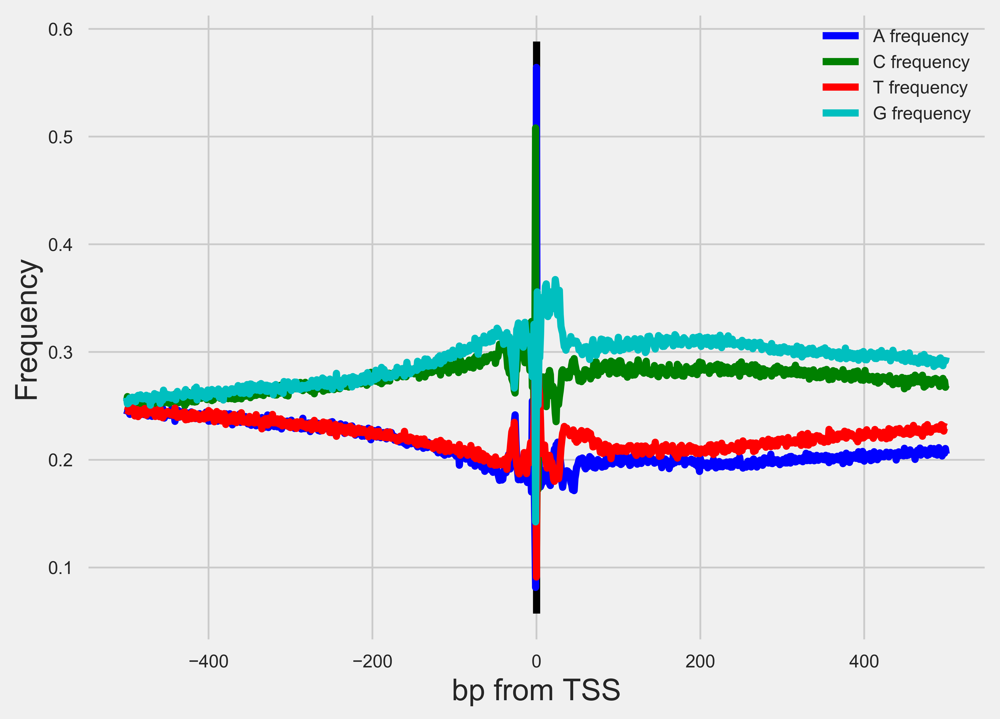

In [16]:
homer_nucleotide("Results/output/TSS1.exp.bed",
    'Results/Figures/Figure3/C_i_exp.nuc_freq_1000.txt',
    ref_fa,
    size=1000)

In [ ]:
mrna_filt = "Results/output/TSS1.exp.bed"
homer_nucleotide(mrna_filt,
    'Results/Figures/Figure3/C_i_refseq.nuc_freq_200.txt',
    ref_fa,
    size=200)

## ii. CHO-specific peaks and CHO-specific tags

annotatePeaks.pl Results/Figures/Figure3/A_ii.mrnafilt /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 200 -hist 1 -di > Results/Figures/Figure3/C_ii_refseq.nuc_freq_200.txt


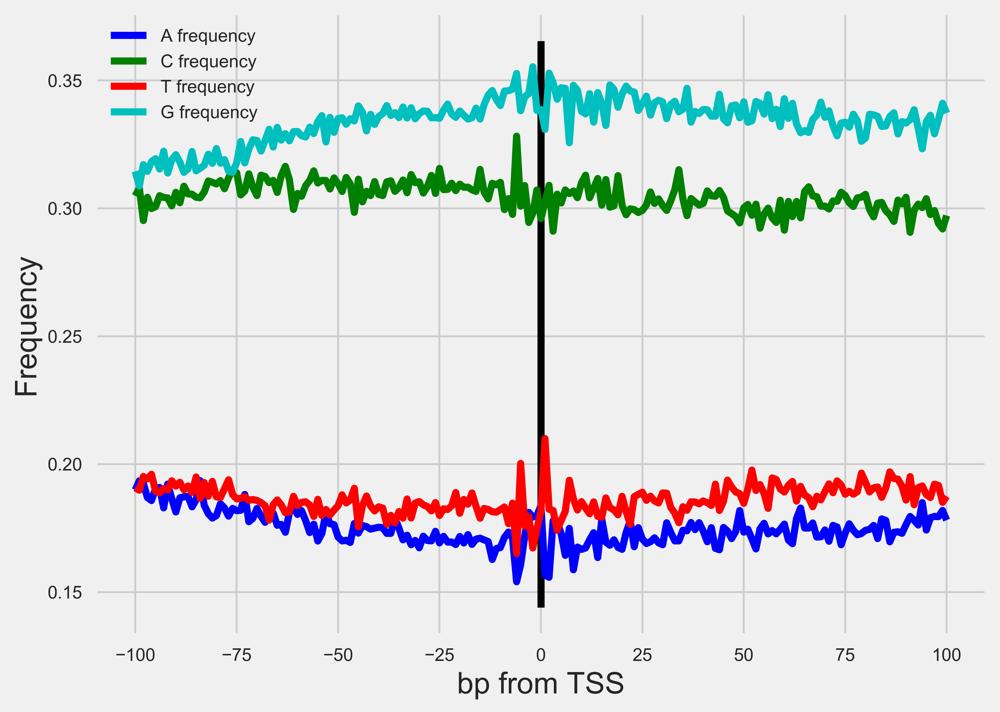

In [17]:
mrna_filt = "Results/Figures/Figure3/A_ii.mrna"
homer_nucleotide(mrna_filt+'filt',
    'Results/Figures/Figure3/C_ii_refseq.nuc_freq_200.txt',
    ref_fa,
    size=200)

annotatePeaks.pl Results/tss_annotation_peaks/sample_CHO_GROCap1_and_CHO_GRO1.tsv /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 200 -hist 1 -di > Results/Figures/Figure3/C_ii_exp.nuc_freq_200.txt


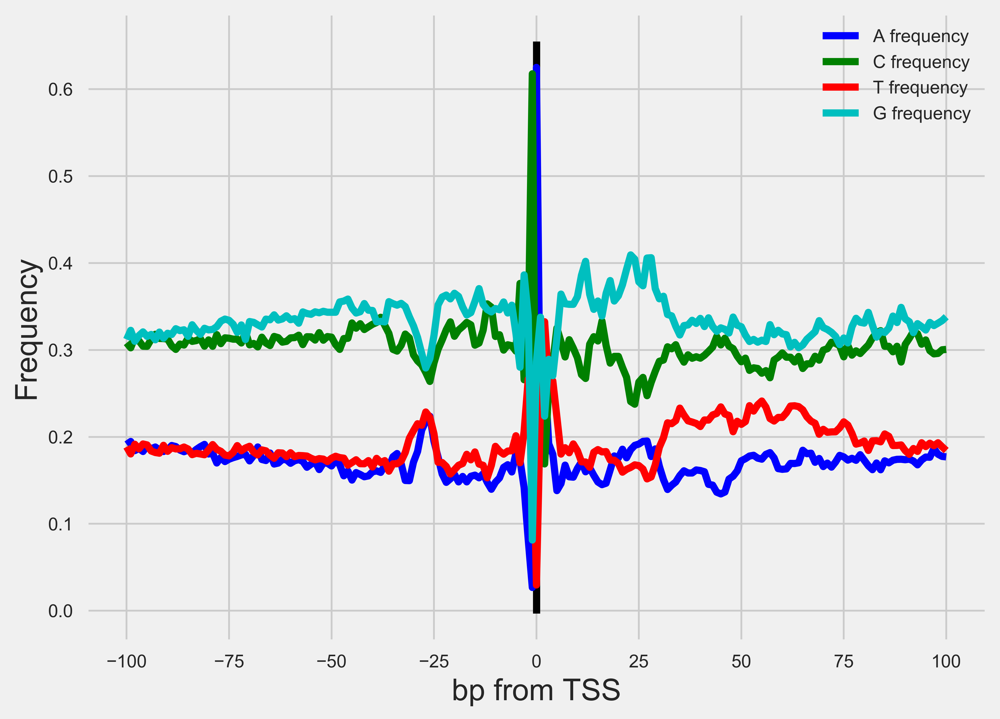

In [18]:
homer_nucleotide("Results/tss_annotation_peaks/sample_CHO_GROCap1_and_CHO_GRO1.tsv",
    'Results/Figures/Figure3/C_ii_exp.nuc_freq_200.txt',
    ref_fa,
    size=200)

In [2]:
mRNA_peak_file

'/data/isshamie/genome/ncbi_anno_103/mRNA_final.peak'

annotatePeaks.pl /data/isshamie/genome/ncbi_anno_103/mRNA_final.peak /data/isshamie/genome/ncbi_anno_103/GCF_003668045.1_CriGri-PICR_genomic.fna -size 200 -hist 1 -di > Results/Figures/Figure3/all_mrna_tss


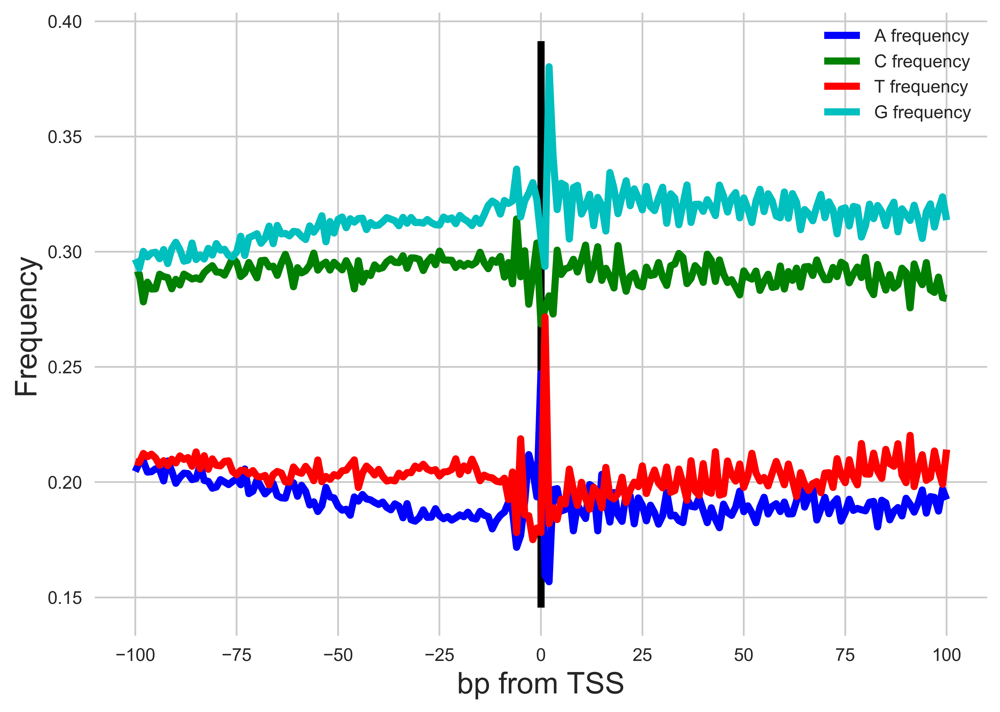

In [6]:
f2 = mRNA_peak_file
homer_nucleotide(f2,
    'Results/Figures/Figure3/all_mrna_tss',
    ref_fa,
    size=200)

------

------

------

------